**Getting data**

In [2]:
!wget --header="Host: ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com" --header="User-Agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/85.0.4183.121 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en,en-US;q=0.9,fr;q=0.8" --header="Referer: https://www.dropbox.com/" "https://ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com/cd/0/get/BB3rdcqDKuYB_1WV9QJ2Toi_1lOQy4ltT88t88i4nYJOZdWFVGqIktjQ4uZLzYg0a7r4ZRNThQBjTAcdg34HLEFK2w3mp1LBL9Ixl98xH3RkRw/file?_download_id=902886681401278462577580158858967971025829340696561826066030709&_notify_domain=www.dropbox.com&dl=1" -c -O 'phase-01-training.tar.gz'

--2020-10-23 20:21:50--  https://ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com/cd/0/get/BB3rdcqDKuYB_1WV9QJ2Toi_1lOQy4ltT88t88i4nYJOZdWFVGqIktjQ4uZLzYg0a7r4ZRNThQBjTAcdg34HLEFK2w3mp1LBL9Ixl98xH3RkRw/file?_download_id=902886681401278462577580158858967971025829340696561826066030709&_notify_domain=www.dropbox.com&dl=1
Resolving ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com (ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com)... 162.125.65.15, 2620:100:6021:15::a27d:410f
Connecting to ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com (ucc5cb060f36bc71a23742b3a0d2.dl.dropboxusercontent.com)|162.125.65.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2749754446 (2.6G) [application/binary]
Saving to: ‘phase-01-training.tar.gz’

phase-01-training.t 100%[===================>]   2.56G  22.0MB/s    in 1m 49s  

2020-10-23 20:23:40 (24.0 MB/s) - ‘phase-01-training.tar.gz’ saved [2749754446/2749754446]



In [25]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"
%cd /content

/content


In [26]:
!kaggle datasets download -d sophatvathana/casia-dataset

100% 5.21G/5.22G [01:33<00:00, 58.7MB/s]
100% 5.22G/5.22G [01:33<00:00, 59.6MB/s]


**Extracting Data**

In [3]:
!tar -xf  '/content/phase-01-training.tar.gz' -C '/content/'

In [27]:
!unzip -qq '/content/casia-dataset.zip'

**Importing libraries**

In [ ]:
!pip install -q pyyaml h5py

In [1]:
!pip install segmentation-models

     |████████████████████████████████| 51kB 2.8MB/s 


In [2]:
import numpy as np
from prettytable import PrettyTable
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools
import seaborn as sns
import shutil
from imageio import imread
import imageio
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications.resnet import ResNet50, ResNet101, ResNet152
import datetime
from keras.callbacks import TensorBoard
import cv2
from skimage.transform import resize
import PIL
from numpy import save,load
from keras.optimizers import Adam,SGD
%env SM_FRAMEWORK=tf.keras
# from tensorflow import keras
import tensorflow as tf
import segmentation_models as sm
from keras import backend as K
import tensorflow_addons as tfa
from segmentation_models import Unet
from tensorflow.keras.layers import Input, Add, Dropout,Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, concatenate,Conv2DTranspose,GlobalMaxPool2D,GlobalAveragePooling2D,UpSampling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from segmentation_models.metrics import iou_score
import gc
from sklearn.utils import shuffle
from albumentations import (
PadIfNeeded,
HorizontalFlip,
VerticalFlip,
Transpose,
HueSaturationValue,
ElasticTransform,
GridDistortion,
OpticalDistortion,
RandomBrightnessContrast,
RandomGamma,Resize
)
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [6]:
 # Dice_Coeff or F1 score
def metric(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

In [7]:
def plot_predicted_images(index):
  
    pred = np.squeeze(predicted[index])
    plt.imsave('pred_mask.png',pred)
    im_gray = cv2.imread('pred_mask.png', cv2.IMREAD_GRAYSCALE)
    (thresh, im_bw) = cv2.threshold(im_gray, 220, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_subplot(331)
    ax2 = fig.add_subplot(332)
    ax3 = fig.add_subplot(333)
    
    ax1.set_title("pristine image")
    ax2.set_title("original mask")
    ax3.set_title("predicted binary mask")
    ax1.imshow(X_val1[index])
    ax2.imshow(np.squeeze(Y_val[index]))
    ax3.imshow(im_bw)

**Building Classification model**

In [28]:
#Method to generate ELA of images
def generate_ela(path,quality):
  temp_file = 'temp_file.jpg'
  # ela_filename = 'temp_ela.png'
  
  image = Image.open(path).convert('RGB')
  image.save(temp_file, 'JPEG', quality = quality)
  temp_image = Image.open(temp_file)
  
  ela_img = ImageChops.difference(image, temp_image)
  
  extrema = ela_img.getextrema()
  max_diff = max([ex[1] for ex in extrema])
  if max_diff == 0:
      max_diff = 1
  scale = 255.0 / max_diff
  
  ela_img = ImageEnhance.Brightness(ela_img).enhance(scale)
  
  return ela_img

In [7]:
#Generating ela from normal images and resizing them
def get_image(path):
    return np.array(generate_ela(path, 90).resize((128,128))).flatten()/255

In [8]:
#Method to plot colored confusion matrix
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion matrix',cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [70]:
X = []
Y = []

In [30]:
#Adding image paths from pristine images with label 1 as they are ground truth
path = '/content/dataset-dist/phase-01/training/pristine'
for dir, paths, files in os.walk(path):
    for filename in files:
      if ('.DS_Store' not in filename):
        # if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dir, filename)
            X.append(get_image(full_path))
            Y.append(1)

print(len(X), len(Y))

1050 1050


In [71]:
#Adding image paths from pristine images with label 1 as they are ground truth
path = '/content/casia/CASIA2/Au'
for dir, paths, files in os.walk(path):
    for filename in files:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dir, filename)
            X.append(get_image(full_path))
            Y.append(1)

print(len(X), len(Y))

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 2. Skipping tag 41487
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 41988
  " Skipping tag %s" % (size, len(data), tag)


7354 7354


In [72]:
#Adding image paths from pristine images with label 1 as they are ground truth
path = '/content/dataset-dist/phase-01/training/fake'
for dir, paths, files in os.walk(path):
    for filename in files:
      if (('.DS_Store' not in filename) and ('.mask.png' not in filename)):
        # if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dir, filename)
            X.append(get_image(full_path))
            Y.append(0)

print(len(X), len(Y))

7804 7804


In [73]:
#Adding image paths from tampered images with label 0
path = '/content/casia/CASIA2/Tp'
for dir, paths, files in os.walk(path):
    for filename in files:
        if ((filename.endswith('jpg') or filename.endswith('png')) and '.mask.png' not in filename):
            full_path = os.path.join(dir, filename)
            X.append(get_image(full_path))
            Y.append(0)
print(len(X), len(Y))

9868 9868


In [74]:
X = np.array(X)
print(X.shape)

(9868, 49152)


In [75]:
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [76]:
#Splitting the data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=20)

In [77]:
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(7894, 128, 128, 3) (7894, 2)
(1974, 128, 128, 3) (1974, 2)


In [78]:
model2 = Sequential()
model2.add(ResNet50(include_top = False, pooling = 'avg', weights = 'imagenet'))
model2.add(Dense(256, activation = 'relu'))
model2.add(Dropout(0.1))
model2.add(Dense(128, activation='relu'))
model2.add(Dense(64, activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(32, activation='relu'))
model2.add(Dropout(0.3))
model2.add(Dense(2, activation = 'softmax'))

In [ ]:
model2.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
dense_15 (Dense)             (None, 256)               524544    
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 32)               

In [43]:
!rm -rf 'logs2/fit/'

In [79]:
epochs = 7
batch_size = 32
init_lr = 1e-4
optimizer = Adam(lr = init_lr, decay = init_lr/epochs)
model2.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])
early_stopping = EarlyStopping(monitor = 'val_accuracy',min_delta = 0,patience = 4,mode = 'auto')
log_dir = "logs2/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [80]:
model2.fit(X_train,Y_train,batch_size = batch_size,epochs = epochs,validation_data = (X_test, Y_test),callbacks = [tensorboard_callback])

Epoch 1/7
247/247 [==============================] - 16s 66ms/step - loss: 0.2572 - accuracy: 0.8832 - val_loss: 1.7946 - val_accuracy: 0.2573
Epoch 2/7
247/247 [==============================] - 14s 58ms/step - loss: 0.1416 - accuracy: 0.9419 - val_loss: 7.9553 - val_accuracy: 0.2573
Epoch 3/7
247/247 [==============================] - 14s 58ms/step - loss: 0.0945 - accuracy: 0.9650 - val_loss: 0.7141 - val_accuracy: 0.6160
Epoch 4/7
247/247 [==============================] - 14s 58ms/step - loss: 0.0822 - accuracy: 0.9710 - val_loss: 8.6171 - val_accuracy: 0.2898
Epoch 5/7
247/247 [==============================] - 14s 58ms/step - loss: 0.0518 - accuracy: 0.9838 - val_loss: 1.9954 - val_accuracy: 0.6322
Epoch 6/7
247/247 [==============================] - 14s 58ms/step - loss: 0.0353 - accuracy: 0.9867 - val_loss: 0.2077 - val_accuracy: 0.9448
Epoch 7/7
247/247 [==============================] - 14s 57ms/step - loss: 0.0320 - accuracy: 0.9887 - val_loss: 0.2299 - val_accuracy: 0.9417

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs2/fit

<IPython.core.display.Javascript object>

In [83]:
!mkdir -p saved_classification_model
model2.save('saved_classification_model/my_model')
# model2.save('saved_classification_model/my_model.h5') 

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: saved_classification_model/my_model/assets


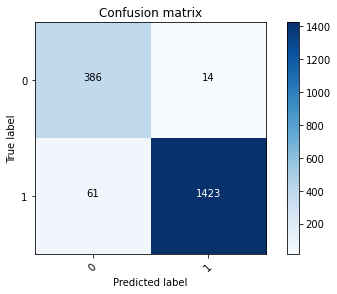

In [ ]:
# Predict the values from the validation dataset and computing the confusion matrix
Y_pred = model2.predict(X_test)
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
Y_true = np.argmax(Y_test,axis = 1) 

confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [84]:
!zip -r /content/classification.zip /content/saved_classification_model

  adding: content/saved_classification_model/ (stored 0%)
  adding: content/saved_classification_model/my_model/ (stored 0%)
  adding: content/saved_classification_model/my_model/saved_model.pb (deflated 92%)
  adding: content/saved_classification_model/my_model/variables/ (stored 0%)
  adding: content/saved_classification_model/my_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/saved_classification_model/my_model/variables/variables.index (deflated 80%)
  adding: content/saved_classification_model/my_model/assets/ (stored 0%)


In [81]:
X_test = []

full_path = os.path.join('/content/dataset-dist/phase-01/training/fake/022354380a1a17ff49226c9eae21a11f.png')
X_test.append(get_image(full_path))

In [82]:
X_test = np.array(X_test)
X_test = X_test.reshape(-1, 128, 128, 3)
Y_pred_test = model2.predict(X_test)
Y_pred_classes_test = np.argmax(Y_pred_test,axis = 1)
print(Y_pred_classes_test)

[0]


**Preprocessing data**

In [8]:
pristine_path = 'dataset-dist/phase-01/training/pristine'
fake_path = 'dataset-dist/phase-01/training/fake'
base_path = 'dataset-dist/phase-01/training/'
os.mkdir(base_path+'ela')
ela_path = 'dataset-dist/phase-01/training/ela'
# paths=[pristine_path,fake_path]
paths=[fake_path]

In [9]:
#method to convert to ela
def ELA(img_path):
    TEMP = 'ela_' + 'temp.jpg'
    SCALE = 10
    original = Image.open(img_path)
    try:
        original.save(TEMP, quality=90)
        temporary = Image.open(TEMP)
        diff = ImageChops.difference(original, temporary)
        
    except:
        
        original.convert('RGB').save(TEMP, quality=92)
        temporary = Image.open(TEMP)
        diff = ImageChops.difference(original.convert('RGB'), temporary)
        
       
    d = diff.load()
    
    WIDTH, HEIGHT = diff.size
    for x in range(WIDTH):
        for y in range(HEIGHT):
            d[x, y] = tuple(k * SCALE for k in d[x, y])
    return diff

In [10]:
fake_images = []
temp = os.listdir(base_path+'fake')
for idx,img in enumerate(temp):
  if(('.mask.png' not in img) and ('.DS_Store' not in img)):
    fake_images.append(img)

for img in tqdm.tqdm(fake_images, position=0, leave=True):
    ELA(fake_path+'/'+img).save(base_path + 'ela/'+img)

100%|██████████| 450/450 [22:40<00:00,  3.02s/it]


In [11]:
#Creating dataframes
mask_dict = {'name':[],'height':[], 'width':[], 'channels':[],'label':[]}
rest_dict = {'name':[],'height':[], 'width':[], 'channels':[],'label':[]}
for path in paths:
    for image in tqdm.tqdm(os.listdir(path),position=0, leave=True):
      if ('.DS_Store' not in image):
        if image.split('.')[-2]=='mask':
            img = imread(path+'/'+image)
            if len(img.shape)==2:
                height, width = img.shape   
                channels = 1
            else:
                height, width, channels = img.shape    
            mask_dict['name'].append(image)
            mask_dict['height'].append(height)
            mask_dict['width'].append(width)
            mask_dict['channels'].append(channels)
            mask_dict['label'].append('mask')
        else:
            try:
                img = imread(path+'/'+image)
                if len(img.shape)==2:
                    height, width = img.shape   
                    channels = 1
                else:
                    height, width, channels = img.shape                
            except:
                pass
            rest_dict['name'].append(image)
            rest_dict['height'].append(height)
            rest_dict['width'].append(width)
            rest_dict['channels'].append(channels)
            rest_dict['label'].append(path.split('/')[3])




for image in tqdm.tqdm(os.listdir(base_path+'ela/'),position=0, leave=True):
      if ('.DS_Store' not in image):
            img = imread(base_path+'ela/'+image)
            if len(img.shape)==2:
                height, width = img.shape   
                channels = 1
            else:
                height, width, channels = img.shape    
            rest_dict['name'].append(image)
            rest_dict['height'].append(height)
            rest_dict['width'].append(width)
            rest_dict['channels'].append(channels)
            rest_dict['label'].append('fake_ela')

df_images = pd.DataFrame.from_dict(rest_dict)
df_masks = pd.DataFrame.from_dict(mask_dict)

 26%|██▌       | 231/901 [00:10<00:26, 25.30it/s]/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 450/450 [00:25<00:00, 17.39it/s]


In [12]:
print(df_images.shape)
print(df_masks.shape)

(900, 5)
(450, 5)


In [13]:
df_images = df_images.sort_values('name')
df_masks = df_masks.sort_values('name')

In [14]:
df_images.head()

,name,height,width,channels,label
254,010543abfbd0db1e9aa1b24604336e0c.png,1536,2048,4,fake
704,010543abfbd0db1e9aa1b24604336e0c.png,1536,2048,3,fake_ela
599,022354380a1a17ff49226c9eae21a11f.png,768,1024,3,fake_ela
149,022354380a1a17ff49226c9eae21a11f.png,768,1024,3,fake
341,0294345b3b2324b195cb3b30e91d7678.png,600,800,4,fake


In [15]:
df_masks.head()

,name,height,width,channels,label
423,010543abfbd0db1e9aa1b24604336e0c.mask.png,1536,2048,4,mask
80,022354380a1a17ff49226c9eae21a11f.mask.png,768,1024,1,mask
160,0294345b3b2324b195cb3b30e91d7678.mask.png,600,800,4,mask
394,0363353570f16ff0a73aa0a03a7795b8.mask.png,765,1024,1,mask
107,0830004e471e511458600f0763ce19f3.mask.png,768,1024,1,mask


In [16]:
fake_names_intersection = list(set([i.split('.')[0] for i in list(df_masks['name'])]) & set([i.split('.')[0] for i in list(df_images[df_images.label=='fake']['name'])]))
print(len(fake_names_intersection))

450


In [17]:
#Adding gaussian blur to masks to reduce noise and converting to single channel
os.mkdir(base_path+'binary_masks')
bin_masks =[]
for mask in tqdm.tqdm(fake_names_intersection,position=0, leave=True):
    mask_img = cv2.imread(base_path+'fake'+'/'+mask+'.mask.png')[:,:,:1]
    blur = cv2.GaussianBlur(mask_img,(5,5),0) #Adding gaussian blur
    ret,bin_mask = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU) #modifing the values to either 0 or 255 
    cv2.imwrite(base_path+'binary_masks/'+mask+'.mask.png',bin_mask)
    bin_masks.append(bin_mask)

100%|██████████| 450/450 [00:13<00:00, 34.40it/s]


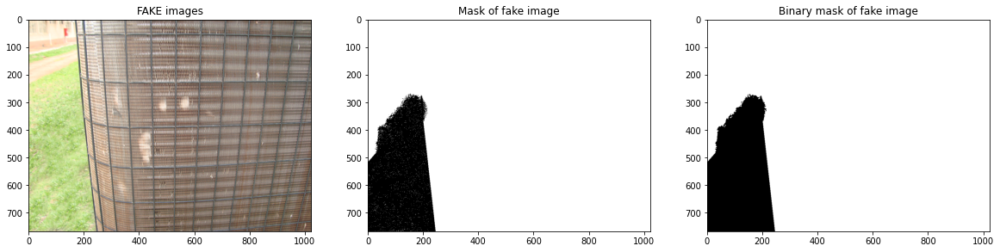

In [ ]:
index = 22
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(base_path+'/fake'+'/'+(df_images[df_images.label=='fake']['name']).iloc[index])
mask_image = imread(base_path+'/fake'+'/'+(df_images[df_images.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
bin_mask = imread(base_path+'/binary_masks/'+(df_images[df_images.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('FAKE images')
ax[1].set_title('Mask of fake image')
ax[2].set_title('Binary mask of fake image')
plt.show()

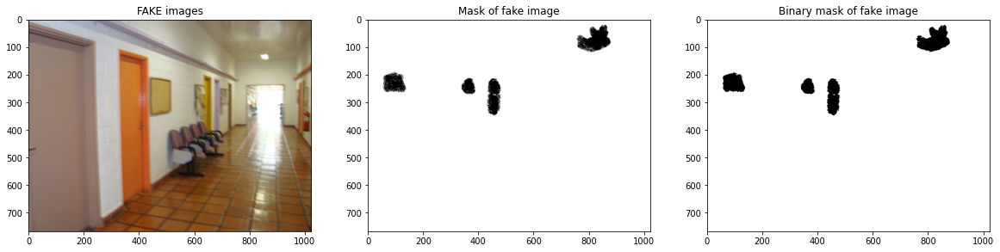

In [ ]:
index = 333
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(base_path+'/fake'+'/'+(df_images[df_images.label=='fake']['name']).iloc[index])
mask_image = imread(base_path+'/fake'+'/'+(df_images[df_images.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
bin_mask = imread(base_path+'/binary_masks/'+(df_images[df_images.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('FAKE images')
ax[1].set_title('Mask of fake image')
ax[2].set_title('Binary mask of fake image')
plt.show()

In [18]:
fake_images_df = pd.DataFrame([i+'.png' for i in fake_names_intersection],columns=['name'])
real_df = df_images[df_images.label == 'pristine']
fake_df = df_images[df_images.label == 'fake']
ela_df = df_images[df_images.label == 'fake_ela']

In [19]:
print(fake_images_df.shape)
print(fake_df.shape)
print(ela_df.shape)

(450, 1)
(450, 5)
(450, 5)


In [20]:
fake_df = fake_df.join(fake_images_df.set_index('name'), on='name',how='right')
ela_df = ela_df.join(fake_images_df.set_index('name'), on='name',how='right')
print(fake_df.shape)
print(ela_df.shape)
df_final = pd.concat([real_df, fake_df,ela_df], ignore_index=True)
print(df_final.shape)

(450, 5)
(450, 5)
(900, 5)


In [21]:
#Splitting the data
X_train, X_test, y_train, y_test = train_test_split(df_final[['channels', 'height', 'name', 'width','label']],df_final['label'], test_size=0.2, stratify=df_final['label'],random_state=42)
# X_train, X_val, y_train, y_val = train_test_split(X_train[['channels', 'height', 'name', 'width','label']],y_train, test_size=0.2, stratify=y_train,random_state=42)

In [22]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(576, 5)
(180, 5)
(576,)
(180,)


**Adding Augmentation**

In [24]:
#Resizing and augmenting images
def agument(aug,image,mask,ela):
    augmented = aug(image=image, mask=mask,ela=ela)
    return augmented['image'],augmented['mask'],augmented['ela']


def resize(image,mask,ela):
    aug = Resize(height=256,width=256,p=1)
    return agument(aug,image,mask,ela)

def horizontalFlip(image,mask,ela):
    aug = HorizontalFlip(p=1)
    return agument(aug,image,mask,ela)
    
def verticalFlip(image,mask,ela):
    aug = VerticalFlip(p=1)
    return agument(aug,image,mask,ela)

def transpose(image,mask,ela):
    aug = Transpose(p=1)
    return agument(aug,image,mask,ela) 

def hueSaturationValue(image,mask,ela):
    aug = HueSaturationValue(p=1,hue_shift_limit=100, sat_shift_limit=100, val_shift_limit=50)
    return agument(aug,image,mask,ela)

def elasticTransform(image,mask,ela):
    aug = ElasticTransform(p=1)
    return agument(aug,image,mask,ela)

def opticalDistortion(image,mask,ela):
    aug = OpticalDistortion(p=1, distort_limit=3, shift_limit=0.4)
    return agument(aug,image,mask,ela)

def randomBrightnessContrast(image,mask,ela):
    aug =RandomBrightnessContrast(p=1,brightness_limit=0.5, contrast_limit=0.4)
    return agument(aug,image,mask,ela)

In [ ]:
!rm -rf 'augmentaions'

In [25]:
#Making directories for fake and pristine augmented data
train_path_fake_aug = 'augmentaions/train/fake_images/'
test_path_fake_aug = 'augmentaions/test/fake_images/'

train_path_fake_aug_ela = 'augmentaions/train/fake_ela/'
test_path_fake_aug_ela = 'augmentaions/test/fake_ela/'

train_path_fake_aug_mask = 'augmentaions/train/fake_mask/'
test_path_fake_aug_mask = 'augmentaions/test/fake_mask/'
# val_path_fake_aug = 'augmentaions/val/fake/'
os.makedirs(train_path_fake_aug)
os.makedirs(test_path_fake_aug)

os.makedirs(train_path_fake_aug_ela)
os.makedirs(test_path_fake_aug_ela)

os.makedirs(train_path_fake_aug_mask)
os.makedirs(test_path_fake_aug_mask)
# os.makedirs(val_path_fake_aug)

# train_path_pr_aug = 'augmentaions/train/pristine/'
# test_path_pr_aug = 'augmentaions/test/pristine/'
# val_path_pr_aug = 'augmentaions/val/pristine/'
# os.makedirs(train_path_pr_aug)
# os.makedirs(test_path_pr_aug)
# os.makedirs(val_path_pr_aug)

In [26]:
#Defining augmentation function
def Augment_data_fake(split_type,Type):
    for name in tqdm.tqdm(split_type[split_type['label']=='fake']['name'],position=0, leave=True):
        name_path = base_path+'fake/'+str(name)
        image_raw= imread(name_path)
        mask_raw = imread(base_path+'binary_masks/'+name.split('.')[0]+'.mask.png')
        ela_raw = imread(base_path+'ela/'+str(name))

        image_0,mask_0,ela_0= resize(image=image_raw,mask=mask_raw,ela=ela_raw)
        image_1,mask_1,ela_1= horizontalFlip(image=image_0,mask=mask_0,ela=ela_0)
        image_2,mask_2,ela_2= verticalFlip(image=image_0,mask=mask_0,ela=ela_0)
        image_3,mask_3,ela_3= transpose(image=image_0,mask=mask_0,ela=ela_0)
        image_4,mask_4,ela_4= hueSaturationValue(image=image_0,mask=mask_0,ela=ela_0)
        image_5,mask_5,ela_5= elasticTransform(image=image_0,mask=mask_0,ela=ela_0)
        image_6,mask_6,ela_6= opticalDistortion(image=image_0,mask=mask_0,ela=ela_0)
        image_7,mask_7,ela_7= randomBrightnessContrast(image=image_0,mask=mask_0,ela=ela_0)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(0)+'.mask.png',mask_0)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(0)+'.png',ela_0)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(1)+'.mask.png',mask_1)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(1)+'.png',ela_1)
        
        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(2)+'.png',image_2)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(2)+'.mask.png',mask_2)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(2)+'.png',ela_2)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(3)+'.png',image_3)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(3)+'.mask.png',mask_3)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(3)+'.png',ela_3)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(4)+'.png',image_4)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(4)+'.mask.png',mask_4)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(4)+'.png',ela_4)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(5)+'.png',image_5)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(5)+'.mask.png',mask_5)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(5)+'.png',ela_5)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(6)+'.png',image_6)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(6)+'.mask.png',mask_6)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(6)+'.png',ela_6)

        cv2.imwrite('augmentaions/'+Type+'/fake_images/'+name.split('.')[0]+'_'+str(7)+'.png',image_7)
        cv2.imwrite('augmentaions/'+Type+'/fake_mask/'+name.split('.')[0]+'_'+str(7)+'.mask.png',mask_7)
        cv2.imwrite('augmentaions/'+Type+'/fake_ela/'+name.split('.')[0]+'_'+str(7)+'.png',ela_7)

# def Augment_data_pristine(split_type,Type):
#     for name in tqdm.tqdm(split_type[split_type['label']=='pristine']['name'],position=0, leave=True):
#         name_path = base_path+'pristine/'+str(name)
#         image_raw= imread(name_path) 
#         mask_raw= imread('default.mask.png') 
#         image_0,mask_0= resize(image=image_raw,mask=mask_raw)
#         image_1,mask_1= verticalFlip(image=image_0,mask=mask_raw)
#         image_2,mask_2= opticalDistortion(image=image_0,mask=mask_raw)
#         cv2.imwrite('augmentaions/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
#         cv2.imwrite('augmentaions/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)     
#         cv2.imwrite('augmentaions/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(3)+'.png',image_2)

In [27]:
Augment_data_fake(X_train,'train')
Augment_data_fake(X_test,'test')
# Augment_data_fake(X_val,'val')

100%|██████████| 90/90 [01:19<00:00,  1.13it/s]


In [28]:
print('Fake train image data after augmentation = ',len(os.listdir(train_path_fake_aug)))
print('Fake train ela data after augmentation = ',len(os.listdir(train_path_fake_aug_ela)))
print('Fake train mask data after augmentation = ',len(os.listdir(train_path_fake_aug_mask)))

print('Fake test image data after augmentation = ',len(os.listdir(test_path_fake_aug)))
print('Fake test ela data after augmentation = ',len(os.listdir(test_path_fake_aug_ela)))
print('Fake test mask data after augmentation = ',len(os.listdir(test_path_fake_aug_mask)))

# print('Fake test data after augmentation = ',len(os.listdir(test_path_fake_aug))/2)
# print('Fake validation data after augmentation = ',len(os.listdir(val_path_fake_aug))/2)

Fake train image data after augmentation =  2304
Fake train ela data after augmentation =  2304
Fake train mask data after augmentation =  2304
Fake test image data after augmentation =  720
Fake test ela data after augmentation =  720
Fake test mask data after augmentation =  720


In [ ]:
#Since there is no mask for pristine images so we will define a default mask
cv2.imwrite("default.mask.png",np.zeros((512,512))+255)
Augment_data_pristine(X_train,'train')
Augment_data_pristine(X_test,'test')
Augment_data_pristine(X_val,'val')

In [ ]:
print('Pristine train data after augmentation = ',len(os.listdir(train_path_pr_aug)))
print('Pristine test data after augmentation = ',len(os.listdir(test_path_pr_aug)))
print('Pristine validation data after augmentation = ',len(os.listdir(val_path_pr_aug)))

Pristine train data after augmentation =  2016
Pristine test data after augmentation =  630
Pristine validation data after augmentation =  504


In [29]:
def MakeData():
  train_df = pd.DataFrame()
  test_df = pd.DataFrame()
  # val_df = pd.DataFrame()
  #Train data
  X1 = []
  X2 = []
  y = []
  #Fake images and mask
  for i in (list({i.split('.')[0] for i in os.listdir(train_path_fake_aug)})):
      i = i.split('.')[0]
      X1.append(train_path_fake_aug+i+'.png')
      X2.append(train_path_fake_aug_ela+i+'.png')
      y.append(train_path_fake_aug_mask+i+'.mask.png')
      
      
  #Pristne images and mask
  # for i in (list({i.split('.')[0] for i in os.listdir(train_path_pr_aug)})):
  #     i = i.split('.')[0]
  #     X1.append(train_path_pr_aug+i+'.png')
  #     y.append('default.mask.png')

  # print(X2)    
  # print(y)
  train_df['X1']  =  X1
  train_df['X2']  =  X2
  train_df['y']  =  y 
  train_df = shuffle(train_df)
  train_df.reset_index(inplace=True, drop=True)

  #Test Data
  X1 = []
  X2 = []
  y = []
  for i in (list({i.split('.')[0] for i in os.listdir(test_path_fake_aug)})):
      i = i.split('.')[0]
      X1.append(test_path_fake_aug+i+'.png')
      X2.append(test_path_fake_aug_ela+i+'.png')
      y.append(test_path_fake_aug_mask+i+'.mask.png')

  # for i in (list({i.split('.')[0] for i in os.listdir(test_path_fake_aug)})):
  #   if('_ela_' not in i):
  #     X1.append(test_path_fake_aug+i+'.png')
  #     y.append(test_path_fake_aug+i+'.mask.png')
  #   else:
  #     X2.append('augmentaions/'+'test'+'/fake/'+i+'.png')
      
  # for i in (list({i.split('.')[0] for i in os.listdir(test_path_pr_aug)})):
  #     X.append(test_path_pr_aug+i+'.png')
  #     y.append('default.mask.png')    
  
  test_df['X1']  =  X1
  test_df['X2']  =  X2
  test_df['y']  =  y 
  test_df = shuffle(test_df)
  test_df.reset_index(inplace=True, drop=True)


  #Validation Data
  # X1 = []
  # X2 = []
  # y = []
  # for i in (list({i.split('.')[0] for i in os.listdir(val_path_fake_aug)})):
  #   if('_ela_' not in i):
  #     X1.append(val_path_fake_aug+i+'.png')
  #     y.append(val_path_fake_aug+i+'.mask.png')
  #   else: 
  #     X2.append('augmentaions/'+'val'+'/fake/'+i+'.png')
      
  # for i in (list({i.split('.')[0] for i in os.listdir(val_path_pr_aug)})):
  #     X.append(val_path_pr_aug+i+'.png')
  #     y.append('default.mask.png')    
  
  # val_df['X1']  =  X1
  # val_df['X2']  =  X2
  # val_df['y']  =  y 
  # val_df = shuffle(val_df)
  # val_df.reset_index(inplace=True, drop=True)

  # return train_df,test_df,val_df
  return train_df,test_df

In [30]:
#Creating final dataframes
train_df = pd.DataFrame()
test_df = pd.DataFrame()
# val_df = pd.DataFrame()
# train_df,test_df,val_df = MakeData()
train_df,test_df = MakeData()
print(train_df.shape)
print(test_df.shape)
# print(val_df.shape)

(2304, 3)
(720, 3)


In [31]:
train_df.head()

,X1,X2,y
0,augmentaions/train/fake_images/588da262d375acd...,augmentaions/train/fake_ela/588da262d375acd1ee...,augmentaions/train/fake_mask/588da262d375acd1e...
1,augmentaions/train/fake_images/daa767cd9cc041a...,augmentaions/train/fake_ela/daa767cd9cc041a3b7...,augmentaions/train/fake_mask/daa767cd9cc041a3b...
2,augmentaions/train/fake_images/1990a2ed067b8c5...,augmentaions/train/fake_ela/1990a2ed067b8c537d...,augmentaions/train/fake_mask/1990a2ed067b8c537...
3,augmentaions/train/fake_images/b9db78fd385d12b...,augmentaions/train/fake_ela/b9db78fd385d12b4ff...,augmentaions/train/fake_mask/b9db78fd385d12b4f...
4,augmentaions/train/fake_images/b46af5d99d6fd9a...,augmentaions/train/fake_ela/b46af5d99d6fd9a7f8...,augmentaions/train/fake_mask/b46af5d99d6fd9a7f...


In [32]:
test_df.head()

,X1,X2,y
0,augmentaions/test/fake_images/bb7ed6b43f565a1f...,augmentaions/test/fake_ela/bb7ed6b43f565a1fe2e...,augmentaions/test/fake_mask/bb7ed6b43f565a1fe2...
1,augmentaions/test/fake_images/b1fb2e2690c484ef...,augmentaions/test/fake_ela/b1fb2e2690c484ef7b0...,augmentaions/test/fake_mask/b1fb2e2690c484ef7b...
2,augmentaions/test/fake_images/b3c8de573cfb53d7...,augmentaions/test/fake_ela/b3c8de573cfb53d7c52...,augmentaions/test/fake_mask/b3c8de573cfb53d7c5...
3,augmentaions/test/fake_images/c3cd547094fa52e6...,augmentaions/test/fake_ela/c3cd547094fa52e65a2...,augmentaions/test/fake_mask/c3cd547094fa52e65a...
4,augmentaions/test/fake_images/cabf04859faf2895...,augmentaions/test/fake_ela/cabf04859faf2895703...,augmentaions/test/fake_mask/cabf04859faf289570...


**Training model**

In [35]:
X_train1 = []
for filename in tqdm.tqdm(train_df['X1'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,3))
  X_train1.append(temp)
gc.collect()
X_train1 = np.array(X_train1)

X_train2 = []
for filename in tqdm.tqdm(train_df['X2'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,3))
  X_train2.append(temp)
gc.collect()
X_train2 = np.array(X_train2)

Y_train = []
for filename in tqdm.tqdm(train_df['y'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,1))
  Y_train.append(temp)
gc.collect()
Y_train = np.array(Y_train)

X_val1 = []
for filename in tqdm.tqdm(test_df['X1'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,3))
  X_val1.append(temp)
gc.collect()
X_val1 = np.array(X_val1)

X_val2 = []
for filename in tqdm.tqdm(test_df['X2'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,3))
  X_val2.append(temp)
gc.collect()
X_val2 = np.array(X_val2)

Y_val = []
for filename in tqdm.tqdm(test_df['y'].values, position=0, leave=True):
  temp = resize(imread(filename),(256,256,1))
  Y_val.append(temp)
gc.collect()
Y_val = np.array(Y_val)

100%|██████████| 720/720 [00:03<00:00, 213.42it/s]


In [36]:
save('/content/X_train1.npy',X_train1)
save('/content/X_train2.npy',X_train2)
save('/content/X_val1.npy',X_val1)
save('/content/X_val2.npy',X_val2)
save('/content/Y_train.npy',Y_train)
save('/content/Y_val.npy',Y_val)

In [ ]:
X_train1 = load('/content/X_train1.npy')
X_train2 = load('/content/X_train2.npy')
X_val1 = load('/content/X_val1.npy')
X_val2 = load('/content/X_val2.npy')
Y_train = load('/content/Y_train.npy')
Y_val = load('/content/Y_val.npy')

**Model with Resnet101 + Upsampe2D(Bilinear interpolation) with images and ELA filter with augmentation**

In [ ]:
path_img = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_img._name = 'path_1'
out1 = Conv2D(3,(1,1), activation='sigmoid')(path_img.output)
layer1 = UpSampling2D(interpolation="bilinear")(out1)

path_filter = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_filter._name = 'path_2'
out2 = Conv2D(3,(1,1), activation='sigmoid')(path_filter.output)
layer3 = UpSampling2D(interpolation="bilinear")(out2)

In [ ]:
for layer in path_img.layers:
    layer._name = layer.name + str("_img")

In [ ]:
combined = concatenate([layer1, layer3])
layer5 = Conv2D(3,(1,1),strides=(2, 2), activation='sigmoid')(combined)
final = Conv2D(1,(1,1),activation='sigmoid')(layer5)
model1 = Model(inputs=[path_img.input,path_filter.input], outputs=[final])

In [ ]:
metrics = [metric]
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3, patience = 1, verbose = 1, min_delta = 0.0001)
model1.compile(tf.keras.optimizers.Adam(0.0001), 'binary_crossentropy',metrics)

In [ ]:
model1.fit([X_train1,X_train2], [Y_train],validation_data=([X_val1,X_val2], [Y_val]),epochs=18, batch_size=1,callbacks=[reduce_lr,early_stop,tensorboard_callback],verbose=1)

Epoch 1/18
2304/2304 [==============================] - 244s 106ms/step - loss: 0.4825 - metric: 0.7590 - val_loss: 0.3557 - val_metric: 0.8309
Epoch 2/18
2304/2304 [==============================] - 237s 103ms/step - loss: 0.3276 - metric: 0.8527 - val_loss: 0.2679 - val_metric: 0.8868
Epoch 3/18
2304/2304 [==============================] - 238s 103ms/step - loss: 0.2803 - metric: 0.8900 - val_loss: 0.2355 - val_metric: 0.9119
Epoch 4/18
2304/2304 [==============================] - 239s 104ms/step - loss: 0.2643 - metric: 0.9079 - val_loss: 0.2229 - val_metric: 0.9243
Epoch 5/18
2304/2304 [==============================] - 239s 104ms/step - loss: 0.2596 - metric: 0.9165 - val_loss: 0.2187 - val_metric: 0.9295
Epoch 6/18
2304/2304 [==============================] - 239s 104ms/step - loss: 0.2582 - metric: 0.9198 - val_loss: 0.2166 - val_metric: 0.9323
Epoch 7/18
2304/2304 [==============================] - 239s 104ms/step - loss: 0.2574 - metric: 0.9219 - val_loss: 0.2158 - val_metric:

In [ ]:
predicted = model2.predict([X_val1,X_val2])

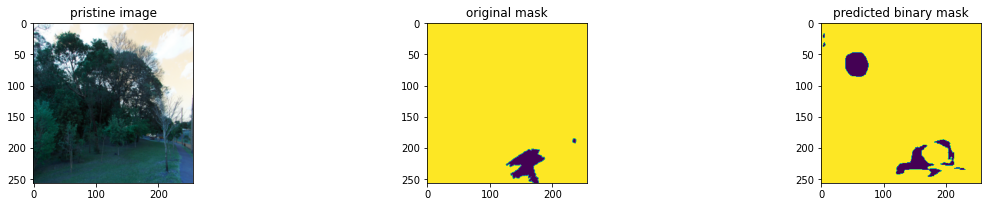

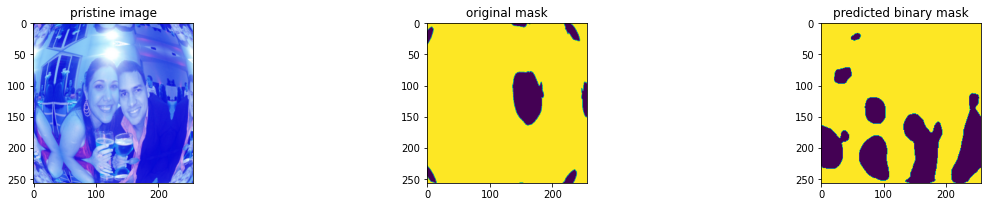

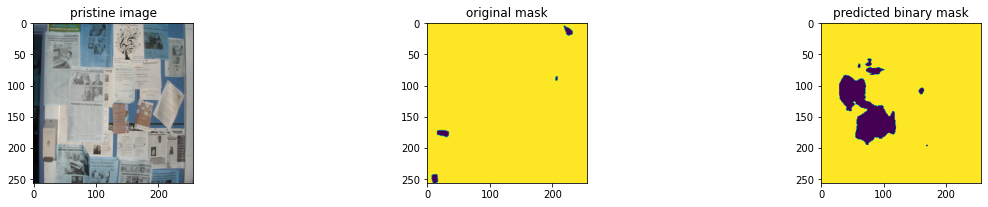

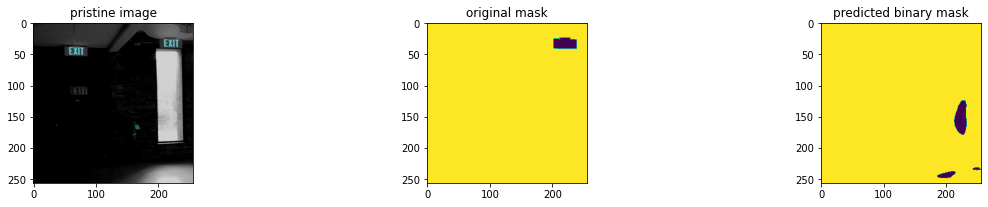

In [ ]:
plot_predicted_images(67)
plot_predicted_images(18)
plot_predicted_images(164)
plot_predicted_images(298)

**Conclusion**
* The model performs well in terms of reducing noise but for accurate mask prediction it needs a little improvement

**Using Add layer instead of concat with Resnet101 with ELA and Augmentation**

In [ ]:
path_img = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_img._name = 'path_1'
out1 = Conv2D(3,(1,1), activation='sigmoid')(path_img.output)
layer1 = Dropout(0.2)(out1)

path_filter = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_filter._name = 'path_2'
out2 = Conv2D(3,(1,1), activation='sigmoid')(path_filter.output)
layer2 = Dropout(0.2)(out2)

171171840/171164896 [==============================] - 5s 0us/step


In [ ]:
for layer in path_img.layers:
    layer._name = layer.name + str("_img2")

In [ ]:
combined = Add()([layer1, layer2])
# layer3 = Dropout(0.3)(combined)
final = Conv2D(1,(1,1),activation='sigmoid')(combined)
model2 = Model(inputs=[path_img.input,path_filter.input], outputs=[final])

In [ ]:
!rm -rf 'logs_mask2/fit/'

In [ ]:
metrics = [metric]
log_dir = "logs_mask2/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3, patience = 1, verbose = 1, min_delta = 0.0001)
model2.compile(tf.keras.optimizers.Adam(0.0001), 'binary_crossentropy',metrics)

In [ ]:
model2.fit([X_train1,X_train2], [Y_train],validation_data=([X_val1,X_val2], [Y_val]),epochs=15, batch_size=1,callbacks=[reduce_lr,early_stop,tensorboard_callback],verbose=1)

Epoch 1/15
   1/2880 [..............................] - ETA: 0s - loss: 1.0607 - metric: 0.4735WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
2880/2880 [==============================] - 492s 171ms/step - loss: 0.6437 - metric: 0.6910 - val_loss: 0.3978 - val_metric: 0.8074
Epoch 2/15
2880/2880 [==============================] - 488s 169ms/step - loss: 0.3536 - metric: 0.8479 - val_loss: 0.2774 - val_metric: 0.8914
Epoch 3/15
2877/2880 [============================>.] - ETA: 0s - loss: 0.2896 - metric: 0.8966

In [ ]:
!rm -rf 'saved_mask2_model'

In [ ]:
!mkdir -p saved_mask2_model
model2.save('saved_mask2_model/my_model2') 
# model2.save('my_model2.h5')

INFO:tensorflow:Assets written to: saved_mask2_model/my_model2/assets


In [ ]:
!zip -r /content/mask2.zip /content/saved_mask2_model

  adding: content/saved_mask2_model/ (stored 0%)
  adding: content/saved_mask2_model/my_model2/ (stored 0%)
  adding: content/saved_mask2_model/my_model2/saved_model.pb (deflated 93%)
  adding: content/saved_mask2_model/my_model2/variables/ (stored 0%)
  adding: content/saved_mask2_model/my_model2/variables/variables.data-00000-of-00001 (deflated 14%)
  adding: content/saved_mask2_model/my_model2/variables/variables.index (deflated 83%)
  adding: content/saved_mask2_model/my_model2/assets/ (stored 0%)


In [ ]:
model2 = tf.keras.models.load_model('saved_model/my_model2')

In [ ]:
# del predicted
predicted2 = model2.predict([X_val1,X_val2])

In [ ]:
def plot_predicted_images(index):
  
    pred = np.squeeze(predicted2[index])
    plt.imsave('pred_mask.png',pred)
    im_gray = cv2.imread('pred_mask.png', cv2.IMREAD_GRAYSCALE)
    (thresh, im_bw) = cv2.threshold(im_gray, 220, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_subplot(331)
    ax2 = fig.add_subplot(332)
    ax3 = fig.add_subplot(333)
    
    ax1.set_title("pristine image")
    ax2.set_title("original mask")
    ax3.set_title("predicted binary mask")
    ax1.imshow(X_val1[index])
    ax2.imshow(np.squeeze(Y_val[index]))
    ax3.imshow(im_bw)

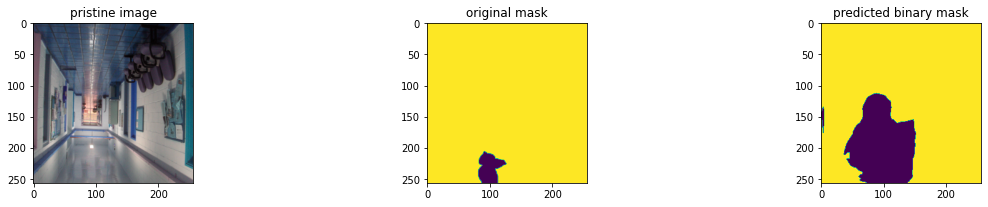

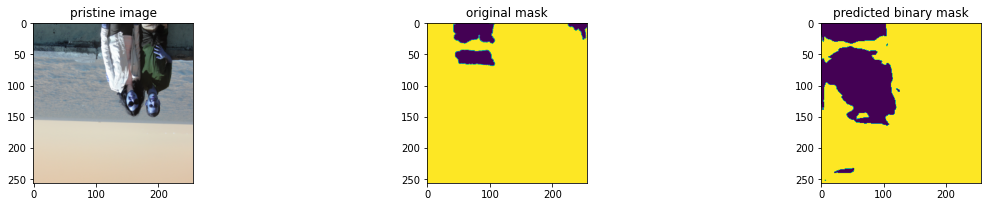

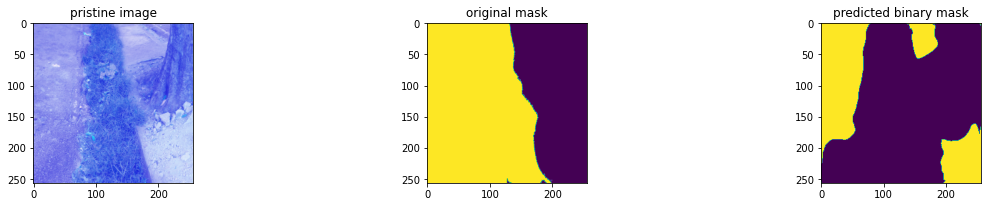

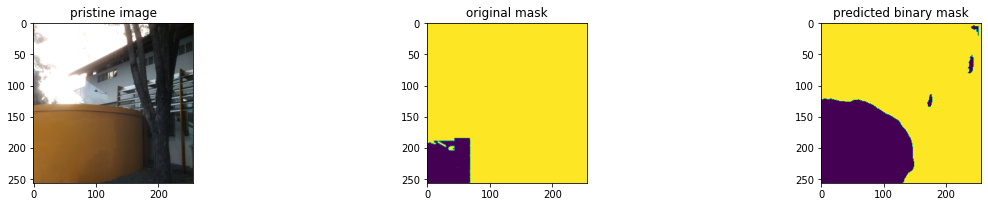

In [ ]:
plot_predicted_images(39)
plot_predicted_images(140)
plot_predicted_images(210)
plot_predicted_images(423)

**Resnet101 with fake images and ELA with Augmentation**

In [37]:
path_img = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_img._name = 'path_1'
out1 = Conv2D(3,(1,1), activation='sigmoid')(path_img.output)

path_filter = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',classes=3,input_shape=(256,256,3),decoder_use_batchnorm=True)
path_filter._name = 'path_2'
out2 = Conv2D(3,(1,1), activation='sigmoid')(path_filter.output)

94593024/94592056 [==============================] - 1s 0us/step


In [38]:
for layer in path_img.layers:
    layer._name = layer.name + str("_img")

In [39]:
combined = concatenate([out1, out2])
# layer5 = Dropout(0.2)(combined)

final = Conv2D(1,(1,1),activation='sigmoid')(combined)
model3 = Model(inputs=[path_img.input,path_filter.input], outputs=[final])

In [49]:
!rm -rf 'logs_mask3/fit/'

In [ ]:
!rm -rf '/content/saved_mask_model' '/content/mask.zip'

In [40]:
metrics = [metric]
log_dir = "logs_mask3/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.22, patience = 1, verbose = 1, min_delta = 0.0001)
model3.compile(tf.keras.optimizers.Adam(0.0001), 'binary_crossentropy',metrics)

In [41]:
model3.fit([X_train1,X_train2], [Y_train],validation_data=([X_val1,X_val2], [Y_val]),epochs=10, batch_size=1,callbacks=[reduce_lr,early_stop,tensorboard_callback],verbose=1)

Epoch 1/10
   1/2304 [..............................] - ETA: 0s - loss: 0.4506 - metric: 0.8126WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
2304/2304 [==============================] - 234s 102ms/step - loss: 0.2507 - metric: 0.9230 - val_loss: 0.2400 - val_metric: 0.9311
Epoch 2/10
2304/2304 [==============================] - ETA: 0s - loss: 0.2472 - metric: 0.9290
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00022000001044943928.
2304/2304 [==============================] - 231s 100ms/step - loss: 0.2472 - metric: 0.9290 - val_loss: 0.2403 - val_metric: 0.9294
Epoch 3/10
2304/2304 [==============================] - 231s 100ms/step - loss: 0.2464 - metric: 0.9279 - val_loss: 0.2398 - val_metric: 0.9312
Epoch 4/10
2304/2304 [==================

In [ ]:
!rm -rf 'saved_mask3_model'

In [42]:
!mkdir -p saved_mask3_model_res50
model3.save('saved_mask3_model_res50/my_model3_res50')
# model3.save('my_model3.h5')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: saved_mask3_model_res50/my_model3_res50/assets


In [ ]:
!zip -r /content/mask3.zip /content/saved_mask3_model

  adding: content/saved_mask3_model/ (stored 0%)
  adding: content/saved_mask3_model/my_model3/ (stored 0%)
  adding: content/saved_mask3_model/my_model3/saved_model.pb (deflated 93%)
  adding: content/saved_mask3_model/my_model3/variables/ (stored 0%)
  adding: content/saved_mask3_model/my_model3/variables/variables.data-00000-of-00001 (deflated 16%)
  adding: content/saved_mask3_model/my_model3/variables/variables.index (deflated 83%)
  adding: content/saved_mask3_model/my_model3/assets/ (stored 0%)


In [43]:
# del predicted
predicted = model3.predict([X_val1,X_val2])

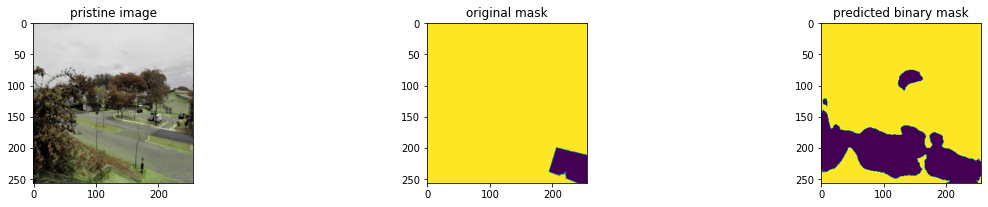

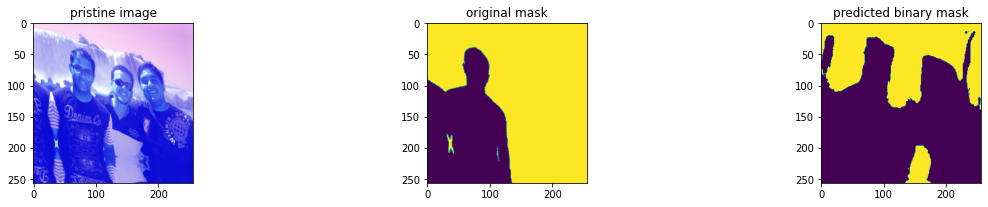

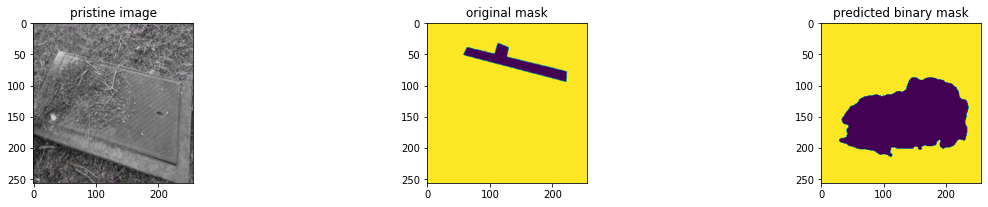

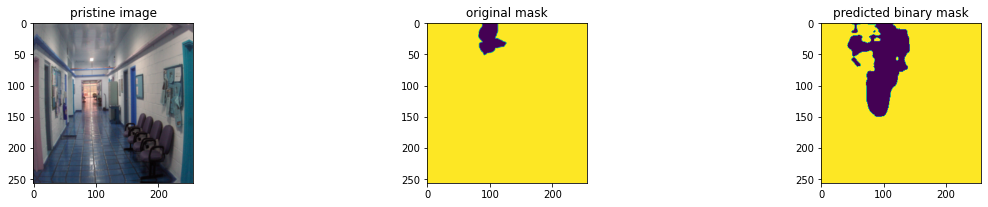

In [ ]:
plot_predicted_images(30)
plot_predicted_images(24)
plot_predicted_images(178)
plot_predicted_images(262)

**ResNet101 Model trained with fake images and their ELA with regularisation and Augmentation**

In [ ]:
path_img = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',input_shape=(256,256,3))
path_img._name = 'path_1'
out1 = Conv2D(3,(1,1), activation='sigmoid')(path_img.output)
# layer1 = MaxPool2D(pool_size=(2,2))(out1)
layer2 = Dropout(0.2)(out1)

path_filter = Unet(backbone_name='resnet101', encoder_weights='imagenet', activation='sigmoid',input_shape=(256,256,3))
path_filter._name = 'path_2'
out2 = Conv2D(3,(1,1), activation='sigmoid')(path_filter.output)
# layer3 = MaxPool2D(pool_size=(2,2))(out2)
layer4 = Dropout(0.2)(out2)

In [ ]:
for layer in path_img.layers:
    layer._name = layer.name + str("_img")

In [ ]:
combined = concatenate([layer2, layer4])
layer5 = Dropout(0.4)(combined)
# layer6 = UpSampling2D()(layer5)
final = Conv2D(1,(1,1),activation='sigmoid')(layer5)
model2 = Model(inputs=[path_img.input,path_filter.input], outputs=[final])

In [ ]:
!rm -rf 'logs_mask2/fit'

In [ ]:
metrics = [metric]
log_dir = "logs_mask2/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3, patience = 1, verbose = 1, min_delta = 0.0001)
model2.compile(tf.keras.optimizers.Adam(0.0001), 'binary_crossentropy',metrics)

In [ ]:
model2.fit([X_train1,X_train2], [Y_train],validation_data=([X_val1,X_val2], [Y_val]),epochs=15, batch_size=1,callbacks=[reduce_lr,early_stop,tensorboard_callback],verbose=1)

Epoch 1/15
2304/2304 [==============================] - 378s 164ms/step - loss: 1.0694 - metric: 0.5346 - val_loss: 0.7095 - val_metric: 0.6453
Epoch 2/15
2304/2304 [==============================] - 372s 162ms/step - loss: 0.6182 - metric: 0.7171 - val_loss: 0.4086 - val_metric: 0.8004
Epoch 3/15
2304/2304 [==============================] - 372s 161ms/step - loss: 0.4250 - metric: 0.8178 - val_loss: 0.2806 - val_metric: 0.8784
Epoch 4/15
2304/2304 [==============================] - 372s 161ms/step - loss: 0.3469 - metric: 0.8654 - val_loss: 0.2394 - val_metric: 0.9097
Epoch 5/15
2304/2304 [==============================] - 372s 161ms/step - loss: 0.3124 - metric: 0.8895 - val_loss: 0.2259 - val_metric: 0.9229
Epoch 6/15
2304/2304 [==============================] - 372s 161ms/step - loss: 0.2936 - metric: 0.9030 - val_loss: 0.2202 - val_metric: 0.9302
Epoch 7/15
2304/2304 [==============================] - 372s 161ms/step - loss: 0.2818 - metric: 0.9104 - val_loss: 0.2186 - val_metric:

In [ ]:
predicted = model2.predict([X_val1,X_val2])

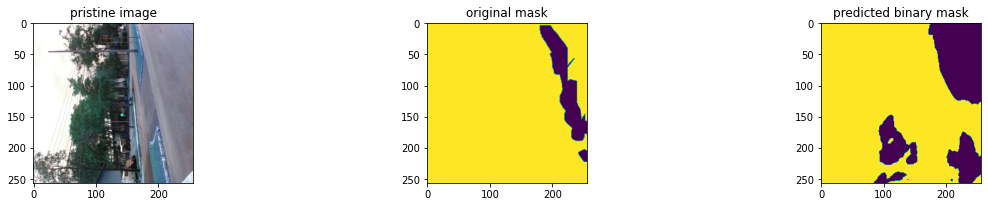

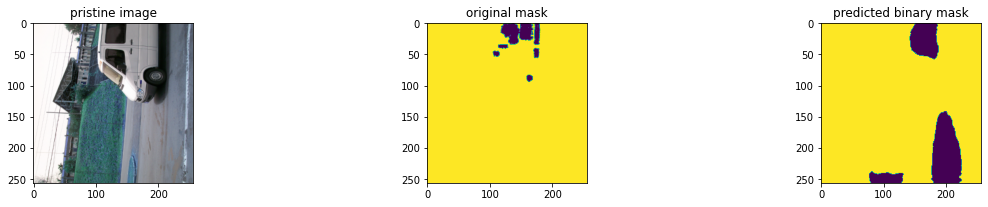

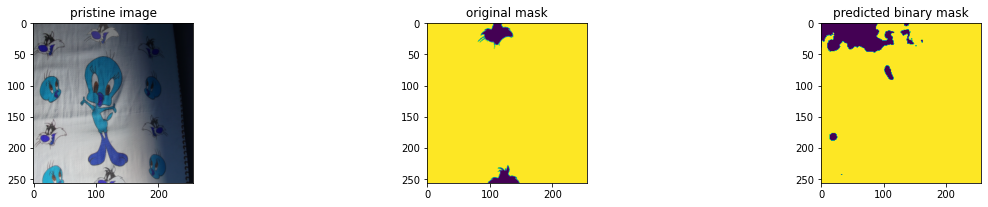

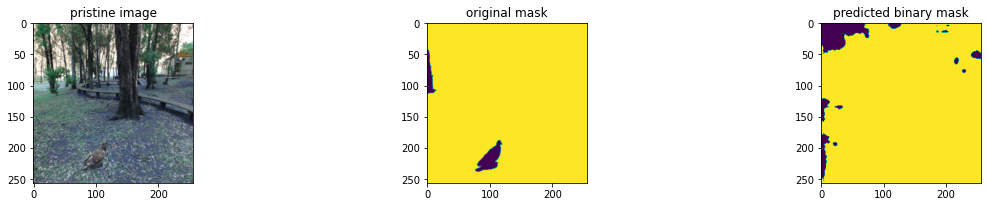

In [ ]:
plot_predicted_images(27)
plot_predicted_images(110)
plot_predicted_images(200)
plot_predicted_images(274)

**Results without ELA, Only with single image input with Augmentation**

In [ ]:
inputs = Input(shape=(512,512,3))
outputs = Unet(backbone_name='resnet34', encoder_weights='imagenet',classes=1, activation='sigmoid',input_shape=(512,512,3),encoder_freeze = True)(inputs)
model = Model(inputs,outputs)

In [ ]:
metrics = [tfa.metrics.F1Score(num_classes=1,average="micro",threshold=0.5)]
model.compile(tf.keras.optimizers.Adam(0.0001), 'binary_crossentropy',metrics)

In [ ]:
model.fit(train_data_generated,steps_per_epoch=64,epochs=5,validation_data=val_data_generated,validation_steps=64)

Epoch 1/5
64/64 [==============================] - 25s 396ms/step - loss: 0.4049 - f1_score: 0.9449 - val_loss: 0.3960 - val_f1_score: 0.9646
Epoch 2/5
64/64 [==============================] - 24s 382ms/step - loss: 0.2825 - f1_score: 0.9704 - val_loss: 0.3905 - val_f1_score: 0.9653
Epoch 3/5
64/64 [==============================] - 24s 379ms/step - loss: 0.2746 - f1_score: 0.9615 - val_loss: 0.3315 - val_f1_score: 0.9653
Epoch 4/5
64/64 [==============================] - 24s 379ms/step - loss: 0.2535 - f1_score: 0.9630 - val_loss: 0.3042 - val_f1_score: 0.9653
Epoch 5/5
64/64 [==============================] - 25s 383ms/step - loss: 0.2325 - f1_score: 0.9646 - val_loss: 0.2773 - val_f1_score: 0.9653


In [ ]:
def print_results(split_data_df,show_images):
    
    samples = split_data_df.sample(n=show_images)
    input_img = []
    input_img_array = []
    mask_array = []
    GT_mask = []
    Predicted_mask = []
    for index,row in samples.iterrows():
        image = load_img(row['X'])
        image_arr = img_to_array(image)
        image_arr=np.array(image_arr).reshape(-1, 512, 512, 3)/255
        #tf_image = tf.data.Dataset.from_tensor_slices(image_arr)
        input_img_array.append(image_arr)
        mask = imread(row['y'])
        mask_arr= img_to_array(mask,dtype=np.uint8)
        mask_array.append(mask_arr/255)
        # output = model.predict(image_arr).reshape(512,512)
        pred = np.squeeze(model.predict(image_arr).reshape(512,512))
        plt.imsave('pred_mask.png',pred)
        im_gray = cv2.imread('pred_mask.png', cv2.IMREAD_GRAYSCALE)
        (thresh, im_bw) = cv2.threshold(im_gray, 220, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        input_img.append(image)
        GT_mask.append(mask)
        Predicted_mask.append(pred)
    
    for i in range(show_images):
        fig, ax = plt.subplots(1,3,figsize=(10, 10))   
        ax[0].imshow(input_img[i])
        ax[0].set_title("Image")
        ax[1].imshow(GT_mask[i])
        ax[1].set_title("Original Mask")
        ax[2].imshow(Predicted_mask[i])
        ax[2].set_title("Predicted Mask")        

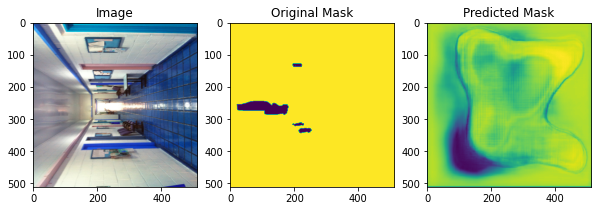

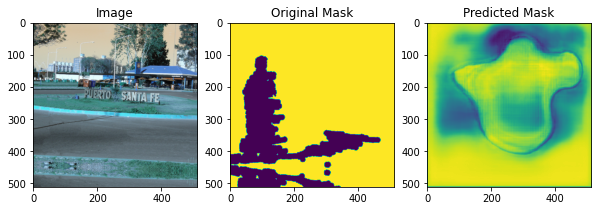

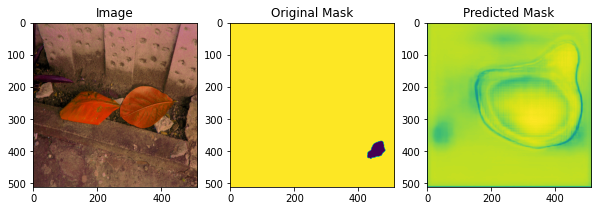

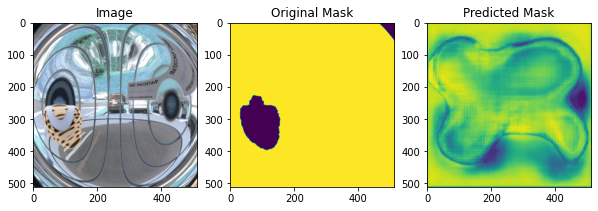

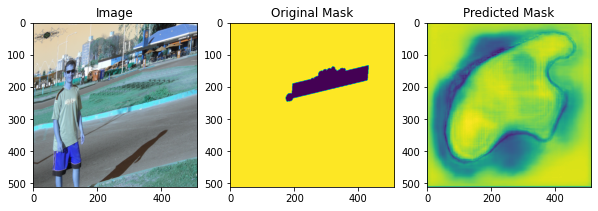

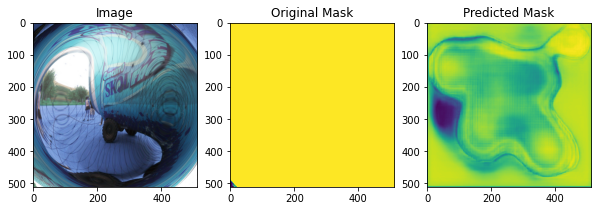

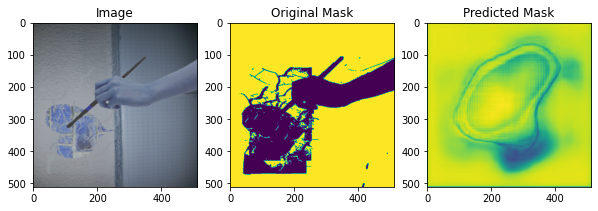

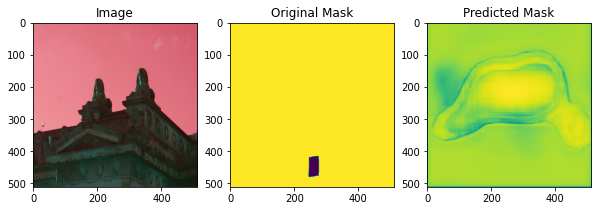

In [ ]:
print_results(test_df[test_df['y']!='default.mask.png'],8)

**Summary of all the models in the notebook**

*Classification model*

In [3]:
x = PrettyTable()
x.field_names = ["Model and architecture used", "Result"]
x.add_row(["Sequential model with ResNet50 and imagenet weights and custom architecture, trained on CASIA2 and IEEE IFS-TC dataset", "Correct predictions = 1809, Incorrect predictions = 75"])
print(x)

+------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------+
|                                              Model and architecture used                                               |                         Result                         |
+------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------+
| Sequential model with ResNet50 and imagenet weights and custom architecture, trained on CASIA2 and IEEE IFS-TC dataset | Correct predictions = 1809, Incorrect predictions = 75 |
+------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------+


*Mask prediction models*

In [3]:
x = PrettyTable()
x.field_names = ["Model and architecture used", "Result"]
x.add_row(["Resnet101 with imagenet weights +Upsampling with bilinear interpolation + Gaussian Blur + Concat output from two streams + ELA filter + With Augmentation", "Less noise but not accurate predictions"])
x.add_row(["Resnet101 with imagenet weights + Gaussian Blur + Add output from two streams + ELA filter + With Augmentation", "Some improvement in mask prediction"])
x.add_row(["Resnet101 with imagenet weights + Gaussian Blur + Concat output from two streams + ELA filter + With Augmentation", "Less noise and good prediction"])
x.add_row(["Resnet101 with imagenet weights + Regularisation + Gaussian Blur + Add output from two streams + ELA filter + With Augmentation", "Similar to without regularisation but with some noise"])
x.add_row(["Resnet34 with imagenet weights + Gaussian Blur + Single input of fake image without ELA + With Augmentation", "A lot of noise"])
print(x)

+-----------------------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------------------------+
|                                                                Model and architecture used                                                                |                         Result                        |
+-----------------------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------------------------+
| Resnet101 with imagenet weights +Upsampling with bilinear interpolation + Gaussian Blur + Concat output from two streams + ELA filter + With Augmentation |        Less noise but not accurate predictions        |
|                       Resnet101 with imagenet weights + Gaussian Blur + Add output from two streams + ELA filter + With Augmentation          